In [ ]:
#Dataset link : https://www.kaggle.com/balraj98/summer2winter-yosemite

In [1]:
%matplotlib inline
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow_addons.layers import *
from PIL import Image
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
import os

In [2]:
def preprocess(records):
    images =  records['image']
    images = tf.cast(images, tf.float32)/255.0
    return images

def tf_pipeline(dataset):
    dataset = tf.data.Dataset.from_tensor_slices({'image':dataset})
    dataset = dataset.map(preprocess)
    dataset = dataset.repeat().shuffle(100).batch(16).prefetch(1)
    return dataset
    
def tf_data(path):
    trainingA = []
    for x in glob.glob(path+'A/*'):
        image = Image.open(x)
        image = image.resize((128,128))
        trainingA.append(np.array(image))
        
    trainingB = []
    for x in glob.glob(path+'B/*'):
        image = Image.open(x)
        image = image.resize((128,128))
        trainingB.append(np.array(image))
    a,b = tf_pipeline(trainingA),tf_pipeline(trainingB)
    return a,b

trainA,trainB = tf_data('train')
trainA = trainA.__iter__()
trainB = trainB.__iter__()

In [3]:
input_dim = (128,128,3)
depth = 4
kernel = 3
n_batch = 16
epochs = 10
steps = round(1500/n_batch)

In [4]:
def discriminator(input_dim,depth,kernel):
    layers = []
    layers.append(Input(shape=input_dim))
    for i in range(1,depth):
            layers.append(Conv2D(16*i,kernel_size=kernel))
            layers.append(InstanceNormalization())
            layers.append(Activation('relu'))
            layers.append(Dropout(0.2))
    layers.append(Conv2D(1,kernel_size=kernel))
    model = Sequential(layers)
    model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam())
    return model

discriminator_A = discriminator(input_dim,depth,kernel)
discriminator_B = discriminator(input_dim,depth,kernel)

In [5]:
def generator(input_dim, depth, kernel):
    layers = []
    layers.append(Input(shape=input_dim))
    for i in range(1,depth):
        layers.append(Conv2D(16*i,kernel_size=kernel))
        layers.append(InstanceNormalization())
        layers.append(Activation('relu'))
        layers.append(Dropout(0.2))
    
    for i in range(1,depth):
        layers.append(Conv2DTranspose(16*i,kernel_size=kernel))
        layers.append(InstanceNormalization())
        layers.append(Activation('relu'))
        layers.append(Dropout(0.2))
    
    resizer =  lambda name: Lambda(lambda images: tf.image.resize(images, [128,128]), name=name)
    layers.append(resizer('Reshape'))
    layers.append(Conv2DTranspose(3,kernel_size=1,activation=None))
    model = Sequential(layers)
    return model

generator_A_B = generator(input_dim,depth,kernel)
generator_B_A = generator(input_dim,depth,kernel)

In [6]:
def composite_model(g1,d,g2,image_dim):
    g1.trainable = True
    g2.trainable = False
    d.trainable = False
    
    #general gan
    input_img = Input(shape=input_dim)
    g1_out = g1(input_img)
    d_out = d(g1_out)
    
    #identity loss
    input_id = Input(shape=input_dim)
    g1_out_id = g1(input_id)
    
    #F-cycle
    g2_out = g2(g1_out)
    
    #B-cycle
    g2_out_id = g2(input_id)
    output_g1 = g1(g2_out_id)
    
    model = Model([input_img,input_id],[d_out, g1_out_id, g2_out, output_g1])
    model.compile(loss=['mse','mae','mae','mae'],loss_weights=[1,5,10,10],optimizer=tf.keras.optimizers.Adam())
    return model

composite_A_B = composite_model(generator_A_B, discriminator_B, generator_B_A, input_dim)
composite_B_A = composite_model(generator_B_A, discriminator_A, generator_A_B, input_dim)

In [7]:
def generate_real(dataset, batch_size,patch_size):
    labels = np.ones((batch_size,patch_size,patch_size,1))
    return dataset,labels

def generate_fake(dataset,g,batch_size,patch_size):
    predicted = g(dataset)
    labels = np.zeros((batch_size,patch_size,patch_size,1))
    return predicted,labels

In [8]:
checkpoint_dir = './cyclegan'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_A_B=generator_A_B, generator_B_A=generator_B_A,discriminator_A=discriminator_A,discriminator_B=discriminator_B,composite_A_B=composite_A_B, composite_B_A=composite_B_A)
manager = tf.train.CheckpointManager(checkpoint, 'cyclegan', max_to_keep=3)
checkpoint.restore(manager.latest_checkpoint)

In [9]:
def train(discriminator_A, discriminator_B, generator_A_B, generator_B_A, composite_A_B, composite_B_A, epochs, batch_size, steps):
    n_patch = discriminator_A.output_shape[1]
    
    for epoch in range(1,epochs):
        for step in range(1,steps):
            print(epoch,step)
            
            x_real_A, y_real_A = generate_real(next(trainA),n_batch,n_patch)
            x_real_B, y_real_B = generate_real(next(trainB),n_batch,n_patch)
            
            x_fake_A, y_fake_A = generate_fake(x_real_B, generator_B_A,n_batch,n_patch)
            x_fake_B, y_fake_B = generate_fake(x_real_A, generator_A_B,n_batch,n_patch)
            
            g_A_B_loss,_,_,_,_ = composite_A_B.train_on_batch([x_real_A,x_real_B],[y_real_B,x_real_B, x_real_A, x_real_B])
            disc_A_real_loss = discriminator_A.train_on_batch(x_real_A, y_real_A)
            disc_A_fake_loss = discriminator_A.train_on_batch(x_fake_A, y_fake_A)
            
            g_B_A_loss,_,_,_,_ = composite_B_A.train_on_batch([x_real_B,x_real_A],[y_real_A,x_real_A, x_real_B, x_real_A])
            disc_B_real_loss = discriminator_B.train_on_batch(x_real_B, y_real_B)
            disc_B_fake_loss = discriminator_B.train_on_batch(x_fake_B, y_fake_B)
            
            print('g_A_B_loss',g_A_B_loss)
            print('g_B_A_loss',g_B_A_loss)
            
            manager.save()

In [10]:
train(discriminator_A, discriminator_B, generator_A_B, generator_B_A, composite_A_B, composite_B_A, epochs, n_batch, steps)

1 1
g_A_B_loss 3.16986083984375
g_B_A_loss 3.2119970321655273
1 2
g_A_B_loss 3.457209587097168
g_B_A_loss 3.3688669204711914
1 3
g_A_B_loss 3.3363561630249023
g_B_A_loss 3.416663646697998
1 4
g_A_B_loss 3.1075522899627686
g_B_A_loss 3.1336143016815186
1 5
g_A_B_loss 3.196408748626709
g_B_A_loss 3.154557228088379
1 6
g_A_B_loss 3.3200535774230957
g_B_A_loss 3.3005146980285645
1 7
g_A_B_loss 3.2238962650299072
g_B_A_loss 3.1804280281066895
1 8
g_A_B_loss 3.289830207824707
g_B_A_loss 3.2878241539001465
1 9
g_A_B_loss 3.272980213165283
g_B_A_loss 3.1786651611328125
1 10
g_A_B_loss 3.0979509353637695
g_B_A_loss 2.908000946044922
1 11
g_A_B_loss 3.1555027961730957
g_B_A_loss 3.024702310562134
1 12
g_A_B_loss 3.3926689624786377
g_B_A_loss 3.179474353790283
1 13
g_A_B_loss 3.1322996616363525
g_B_A_loss 3.1227896213531494
1 14
g_A_B_loss 3.2835474014282227
g_B_A_loss 3.0960612297058105
1 15
g_A_B_loss 3.0085525512695312
g_B_A_loss 3.0868546962738037
1 16
g_A_B_loss 2.8933324813842773
g_B_A_loss

KeyboardInterrupt: 

In [11]:
testA,testB = tf_data('test')
testA = testA.__iter__()
testB = testB.__iter__()

In [20]:
x_real_A, _ = generate_real(next(testA),n_batch,0)
images_B,_ = generate_fake(x_real_A, generator_A_B,n_batch,0)

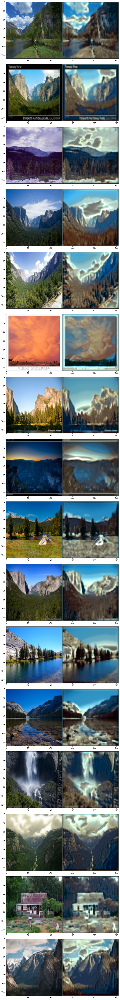

In [21]:
import matplotlib
fig,ax = plt.subplots(n_batch,figsize=(75,75))
for index,img in enumerate(zip(x_real_A,images_B)):
    concat_numpy = np.clip(np.hstack((img[0],img[1])),0,1)
    ax[index].imshow(concat_numpy)
    #matplotlib.image.imsave(str(index)+'.png', concat_numpy)
    
fig.tight_layout()

In [24]:
x_real_B, _ = generate_real(next(testB),n_batch,0)
images_A,_ = generate_fake(x_real_B, generator_B_A,n_batch, 0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

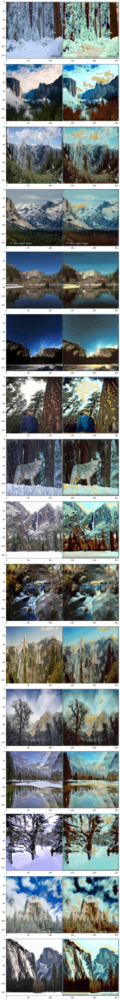

In [25]:
fig,ax = plt.subplots(n_batch,figsize=(75,75))
for index,img in enumerate(zip(x_real_B,images_A)):
    concat_numpy = np.hstack((img[0],img[1]))
    ax[index].imshow(concat_numpy)
fig.tight_layout()

(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)


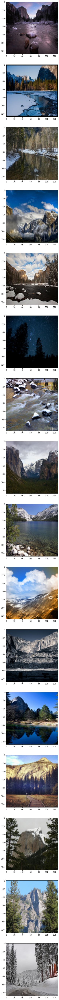

In [72]:

fig,ax = plt.subplots(n_batch,figsize=(100,100))
for index,x in enumerate(x_real_B):
    print(x.shape)
    ax[index].imshow(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)


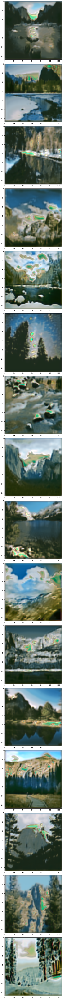

In [73]:
fig,ax = plt.subplots(n_batch,figsize=(100,100))
for index,x in enumerate(images):
    print(x.shape)
    ax[index].imshow(x)
fig.tight_layout()

In [ ]:
!pip install opencv-python